<a href="https://colab.research.google.com/github/sanaomaro/AIM-5001/blob/main/S_Omar_M12_assn.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Movies Review Sentiment Analysis**



**Sana Omar**

**Data Acquistion and Management**

**M12 Assignment**

**Katz University**

In [ ]:
import requests
from bs4 import BeautifulSoup
import urllib
from nltk.tokenize import RegexpTokenizer
import nltk
import pandas as pd
import re
from sklearn.datasets import fetch_20newsgroups
import string

**Introduction**

The problem of applying sentiment analysis to 2000 reviews devided into two prts: 1000 positive reviews and 1000 negtive reviews.

**The steps followed are:**

1. Scraping these files and reading them from github repository.

2. Cleaning their content - review data - from punctuation marks or any charachters that are not words.

3. Tokenizing into two groups - lists: 

    one for negtive tokens words the other for positive tokens words.

4. Making a dataframe out of it, and labeling the negative words with zero and poistive ones with 1 in a new column called sentiment.

5. Vectorizing these words in two methods: 

    BoW bag of words which is counting the words or calculatingthe frequency of a word appearning against the whole word collection [positive nd negative] in this notebook we used counting.

    The other method using a out of the box countervector library from scikit lib to do the same mission. 

This is called term document.

6. Calculating the sparce matrix from the previous result and plotting the frequency distribution.

7. Lastly, dividing the data into 25%, 75% for testing and training using the Model using TF-IDF - this process called text classification.

In [ ]:
#this 3 lines of code were recommended by stack community to increase the ram to double, but it didnot.
a = []
while 1:
    a.append("1")

**Scraping the github repository to get to the files links**

In [ ]:
def get_urls(url):
  response = requests.get(url)
  if response.ok:
    response_txt = response.text
    soup = BeautifulSoup(response_txt, 'html.parser')
    all = [node.get('href').split('/')[-1] for node in soup.find_all('a') if node.get('href').endswith('txt')]
    return all
  else:
    return response.raise_for_status()

neg_url = 'https://www.github.com/sanaomaro/AIM-5001/tree/main/txt_sentoken/neg'
pos_url = 'https://www.github.com/sanaomaro/AIM-5001/tree/main/txt_sentoken/pos'

neg_files = get_urls(neg_url)
pos_files = get_urls(pos_url)

print(neg_files)
print(pos_files)
type(neg_files)

['cv000_29416.txt', 'cv001_19502.txt', 'cv002_17424.txt', 'cv003_12683.txt', 'cv004_12641.txt', 'cv005_29357.txt', 'cv006_17022.txt', 'cv007_4992.txt', 'cv008_29326.txt', 'cv009_29417.txt', 'cv010_29063.txt', 'cv011_13044.txt', 'cv012_29411.txt', 'cv013_10494.txt', 'cv014_15600.txt', 'cv015_29356.txt', 'cv016_4348.txt', 'cv017_23487.txt', 'cv018_21672.txt', 'cv019_16117.txt', 'cv020_9234.txt', 'cv021_17313.txt', 'cv022_14227.txt', 'cv023_13847.txt', 'cv024_7033.txt', 'cv025_29825.txt', 'cv026_29229.txt', 'cv027_26270.txt', 'cv028_26964.txt', 'cv029_19943.txt', 'cv030_22893.txt', 'cv031_19540.txt', 'cv032_23718.txt', 'cv033_25680.txt', 'cv034_29446.txt', 'cv035_3343.txt', 'cv036_18385.txt', 'cv037_19798.txt', 'cv038_9781.txt', 'cv039_5963.txt', 'cv040_8829.txt', 'cv041_22364.txt', 'cv042_11927.txt', 'cv043_16808.txt', 'cv044_18429.txt', 'cv045_25077.txt', 'cv046_10613.txt', 'cv047_18725.txt', 'cv048_18380.txt', 'cv049_21917.txt', 'cv050_12128.txt', 'cv051_10751.txt', 'cv052_29318.txt', 

list

**Downloading the necessary libraries**

In [ ]:
!pip install nltk

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install textblob

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [ ]:
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [ ]:
nltk.download('omw-1.4')

[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


True

In [ ]:
!pip install pyspellchecker

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


**Text Cleaning - positive files and negative files.**

It involves cleaning the text in following ways:

*  Remove stop words - 
*  Convert to lower - 
*  Remove punctuation - 
*  Remove number - 
*  Remove whitespaces - If necessary.
*  Stemming & Lemmatization - Finally, we convert the terms into their root form.

In [ ]:
def calculateBOW(wordset,doc):
  tf_diz = dict.fromkeys(wordset,0)
  for word in doc:
      tf_diz[word]=doc.count(word)
  return tf_diz

In [ ]:
from nltk import word_tokenize,sent_tokenize
import re
import string
from nltk.corpus import stopwords
from textblob import TextBlob
#from spellchecker import SpellChecker

stop_words=set(stopwords.words("english"))
neg = []
textnlist = []
filtered_sent=[]
tf_dizlist = []
corpus  = []
tokenSentlist = []
tokenWordlist = []
textty = []
for file in neg_files:
  urln = "https://raw.githubusercontent.com/sanaomaro/AIM-5001/main/txt_sentoken/neg"
  urlp = 'https://raw.githubusercontent.com/sanaomaro/AIM-5001/main/txt_sentoken/pos'
  pathn = urln + '/' + file

  responsen = urllib.request.urlopen(pathn)
  textn = responsen.read()
  textn = textn.decode('utf-8')
  textn = " ".join(textn.split("\n")[:-1])
  corpus.append(textn)
  #print(textn)
  #type(textn)
  textn = re.sub(r"[^a-zA-Z]", " ", textn.lower()).split()
  textn =  [w for w in textn if not w in stop_words]
  textty.append([w for w in textn if not w in stop_words])

  
  strList = list(map(str, textn))
  myString = " ".join(strList)
  #correcting spelling
  #blob = TextBlob(myString)
  #type(blob)
  
  #spell = SpellChecker()
  #misspelled = spell.unknown(myString)
  #new_doc = TextBlob(myString)
  #result = new_doc.correct()
  #print(result)
 # print(misspelled)
 # blob.correct()
  #myString.apply(lambda x: str(TextBlob(x).correct()))
  tokenized_textn=sent_tokenize(myString)
  tokenized_wordn=word_tokenize(myString)

  textnlist.append(myString)
  tokenSentlist.append(tokenized_textn)
  for word in tokenized_wordn:
    tokenWordlist.append(word)
    

  
  #remove any non-alphabetical charachters ^\w  Match a non-word character \D  Match a non-digit character \s none-space
  #puncremove = re.compile(r'[^\w\s]'% re.escape(textn))
  #puncremove = re.compile('[%s]' % re.escape((string.punctuation)))



  
  #bow3 = calculateBOW(wordset,l_doc3)


  #puncremove = re.compile('[%s]' % re.escape((string.punctuation)))
    # remove punctuation from each wor
  #tokens = [puncremove.sub('', w) for w in textn]
# remove remaining tokens that are not alphabetic
  #tokens = [word for word in tokens if word.isalpha()]
  
  #for w in tokenized_sent:
  #  if w not in stop_words:
  #      filtered_sent.append(w)
  #tokens = [w for w in tokens if not w in stop_words]
  #print(type(tokens))
  #tokenized_textn=sent_tokenize(tokens)
  #tokenized_wordn=word_tokenize(tokens)

  #print(tokenized_text)
#def calculateBOW(wordset,textn):
 # tf_diz = dict.fromkeys(textn,0)
  #for word in textn:
  #  tf_diz[word]=textn.count(word)
  #return tf_diz

df_bow = pd.DataFrame([textnlist])

#df_negVectorPerReview = pd.DataFrame([neg])
#df_negVectorAllwords = pd.DataFrame(neg)


In [ ]:
df_bow.head()

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
0,plot two teen couples go church party drink dr...,happy bastard quick movie review damn k bug go...,movies like make jaded movie viewer thankful i...,quest camelot warner bros first feature length...,synopsis mentally unstable man undergoing psyc...,capsule planet mars police taking custody accu...,ask mm eight millimeter really wholesome surve...,exactly long movie felt even nine laughs nine ...,call road trip walking wounded stellan skarsg ...,plot young french boy sees parents killed eyes...,...,man one wierd movie similar conspiracy theory ...,king warner brothers animated musical feature ...,synopsis cro magnon ayla loses mother earthqua...,salaries hollywood top actors getting obscenel...,movies like six days seven nights make mad tal...,anything stigmata taken warning releasing simi...,john boorman zardoz goofy cinematic debacle fu...,kids hall acquired taste took least season wat...,time john carpenter great horror director cour...,two party guys bob heads haddaway dance hit lo...


In [ ]:
df_bow = df_bow.T


In [ ]:
df_bow.shape

(1000, 1)

In [ ]:
len(textnlist)

1000

In [ ]:
dfsentNeg = pd.DataFrame(textnlist)

In [ ]:
dfsentNeg['sentiment'] = 0

In [ ]:
dfsentNeg

,0,sentiment
0,plot two teen couples go church party drink dr...,0
1,happy bastard quick movie review damn k bug go...,0
2,movies like make jaded movie viewer thankful i...,0
3,quest camelot warner bros first feature length...,0
4,synopsis mentally unstable man undergoing psyc...,0
...,...,...
995,anything stigmata taken warning releasing simi...,0
996,john boorman zardoz goofy cinematic debacle fu...,0
997,kids hall acquired taste took least season wat...,0
998,time john carpenter great horror director cour...,0


In [ ]:
dfsentNeg.columns.values[0] = "sentence"
dfsentNeg

,sentence,sentiment
0,plot two teen couples go church party drink dr...,0
1,happy bastard quick movie review damn k bug go...,0
2,movies like make jaded movie viewer thankful i...,0
3,quest camelot warner bros first feature length...,0
4,synopsis mentally unstable man undergoing psyc...,0
...,...,...
995,anything stigmata taken warning releasing simi...,0
996,john boorman zardoz goofy cinematic debacle fu...,0
997,kids hall acquired taste took least season wat...,0
998,time john carpenter great horror director cour...,0


In [ ]:
textnlist[0]

'plot two teen couples go church party drink drive get accident one guys dies girlfriend continues see life nightmares deal watch movie sorta find critique mind fuck movie teen generation touches cool idea presents bad package makes review even harder one write since generally applaud films attempt break mold mess head lost highway memento good bad ways making types films folks snag one correctly seem taken pretty neat concept executed terribly problems movie well main problem simply jumbled starts normal downshifts fantasy world audience member idea going dreams characters coming back dead others look like dead strange apparitions disappearances looooot chase scenes tons weird things happen simply explained personally mind trying unravel film every give clue get kind fed film biggest problem obviously got big secret hide seems want hide completely final five minutes make things entertaining thrilling even engaging meantime really sad part arrow dig flicks like actually figured half wa

In [ ]:
tokenSentlist[0]

['plot two teen couples go church party drink drive get accident one guys dies girlfriend continues see life nightmares deal watch movie sorta find critique mind fuck movie teen generation touches cool idea presents bad package makes review even harder one write since generally applaud films attempt break mold mess head lost highway memento good bad ways making types films folks snag one correctly seem taken pretty neat concept executed terribly problems movie well main problem simply jumbled starts normal downshifts fantasy world audience member idea going dreams characters coming back dead others look like dead strange apparitions disappearances looooot chase scenes tons weird things happen simply explained personally mind trying unravel film every give clue get kind fed film biggest problem obviously got big secret hide seems want hide completely final five minutes make things entertaining thrilling even engaging meantime really sad part arrow dig flicks like actually figured half w

In [ ]:
pos = []

textplist = []
filtered_sent=[]
tf_dizlist = []
corpus  = []
tokenSentlistp = []
tokenWordlistp = []
texttyp = []
for file in pos_files:
  urln = "https://raw.githubusercontent.com/sanaomaro/AIM-5001/main/txt_sentoken/neg"
  urlp = 'https://raw.githubusercontent.com/sanaomaro/AIM-5001/main/txt_sentoken/pos'
  pathp = urlp + '/' + file

  responsep = urllib.request.urlopen(pathp)
  textp = responsep.read()
  textp = textp.decode('utf-8')
  textp = " ".join(textp.split("\n")[:-1])
  corpus.append(textp)
  #print(textn)
  #type(textn)
  textp = re.sub(r"[^a-zA-Z]", " ", textp.lower()).split()
  textp =  [w for w in textp if not w in stop_words]
  texttyp.append([w for w in textp if not w in stop_words])

  
  strList = list(map(str, textp))
  myString = " ".join(strList)
  #correcting spelling
  #blob = TextBlob(myString)
  #type(blob)
  
  #spell = SpellChecker()
  #misspelled = spell.unknown(myString)
  #new_doc = TextBlob(myString)
  #result = new_doc.correct()
  #print(result)
 # print(misspelled)
 # blob.correct()
  #myString.apply(lambda x: str(TextBlob(x).correct()))
  tokenized_textp=sent_tokenize(myString)
  tokenized_wordp=word_tokenize(myString)
  textplist.append(myString)
  
  tokenSentlistp.append(tokenized_textp)
  for word in tokenized_wordp:
    tokenWordlistp.append(word)
    
  #print(textn)
  #post = calculateBOW(textp,textp)
  #pos.append(calculateBOW(textp,textp))
  

#df_posVectorPerReview = pd.DataFrame([pos])
#df_posVectorAllwords = pd.DataFrame(pos)


In [ ]:
df_bowp = pd.DataFrame(textplist)
df_bowp

,0
0,films adapted comic books plenty success wheth...
1,every movie comes along suspect studio every i...
2,got mail works alot better deserves order make...
3,jaws rare film grabs attention shows single im...
4,moviemaking lot like general manager nfl team ...
...,...
995,wow movie everything movie funny dramatic inte...
996,richard gere commanding actor always great fil...
997,glory starring matthew broderick denzel washin...
998,steven spielberg second epic film world war ii...


In [ ]:
df_bowp['sentiment'] = 1

In [ ]:
df_bowp.columns.values[0] = "sentence"
df_bowp

,sentence,sentiment
0,films adapted comic books plenty success wheth...,1
1,every movie comes along suspect studio every i...,1
2,got mail works alot better deserves order make...,1
3,jaws rare film grabs attention shows single im...,1
4,moviemaking lot like general manager nfl team ...,1
...,...,...
995,wow movie everything movie funny dramatic inte...,1
996,richard gere commanding actor always great fil...,1
997,glory starring matthew broderick denzel washin...,1
998,steven spielberg second epic film world war ii...,1


In [ ]:
len(textplist)

1000

In [ ]:
allsent = tokenSentlist + tokenSentlistp
len(allsent)

2000

In [ ]:
dfsent = pd.concat([dfsentNeg, df_bowp], axis=0)
dfsent

,sentence,sentiment
0,plot two teen couples go church party drink dr...,0
1,happy bastard quick movie review damn k bug go...,0
2,movies like make jaded movie viewer thankful i...,0
3,quest camelot warner bros first feature length...,0
4,synopsis mentally unstable man undergoing psyc...,0
...,...,...
995,wow movie everything movie funny dramatic inte...,1
996,richard gere commanding actor always great fil...,1
997,glory starring matthew broderick denzel washin...,1
998,steven spielberg second epic film world war ii...,1


In [ ]:
#import itertools
allwords  = tokenWordlist + tokenWordlistp


In [ ]:
len(tokenWordlist)

330574

In [ ]:
len(tokenWordlistp)

372147

In [ ]:
len(allwords)

702721

**Making dataframe and labeling it: zero for negative words, and 1 for positive words - under sentiment column.**

In [ ]:
dfNegW = pd.DataFrame(tokenWordlist) 
dfposW = pd.DataFrame(tokenWordlistp) 

In [ ]:
# zero means negative
dfNegW['sentiment'] = 0
dfNegW

,0,sentiment
0,plot,0
1,two,0
2,teen,0
3,couples,0
4,go,0
...,...,...
330569,watching,0
330570,night,0
330571,roxbury,0
330572,left,0


In [ ]:
#one means positive review
dfposW['sentiment'] = 1
dfposW

,0,sentiment
0,films,1
1,adapted,1
2,comic,1
3,books,1
4,plenty,1
...,...,...
372142,niccol,1
372143,next,1
372144,film,1
372145,whatever,1


In [ ]:
dfW = pd.concat([dfNegW, dfposW], axis=0)
dfW

,0,sentiment
0,plot,0
1,two,0
2,teen,0
3,couples,0
4,go,0
...,...,...
372142,niccol,1
372143,next,1
372144,film,1
372145,whatever,1


In [ ]:
dfW.columns.values[0] = "word"
dfW

,word,sentiment
0,plot,0
1,two,0
2,teen,0
3,couples,0
4,go,0
...,...,...
372142,niccol,1
372143,next,1
372144,film,1
372145,whatever,1


**Without using vectorization library from scikit learn, only BoW bag of words, calculating the item document.**

In [ ]:
listofwords = textty + texttyp
listofwords

[['plot',
  'two',
  'teen',
  'couples',
  'go',
  'church',
  'party',
  'drink',
  'drive',
  'get',
  'accident',
  'one',
  'guys',
  'dies',
  'girlfriend',
  'continues',
  'see',
  'life',
  'nightmares',
  'deal',
  'watch',
  'movie',
  'sorta',
  'find',
  'critique',
  'mind',
  'fuck',
  'movie',
  'teen',
  'generation',
  'touches',
  'cool',
  'idea',
  'presents',
  'bad',
  'package',
  'makes',
  'review',
  'even',
  'harder',
  'one',
  'write',
  'since',
  'generally',
  'applaud',
  'films',
  'attempt',
  'break',
  'mold',
  'mess',
  'head',
  'lost',
  'highway',
  'memento',
  'good',
  'bad',
  'ways',
  'making',
  'types',
  'films',
  'folks',
  'snag',
  'one',
  'correctly',
  'seem',
  'taken',
  'pretty',
  'neat',
  'concept',
  'executed',
  'terribly',
  'problems',
  'movie',
  'well',
  'main',
  'problem',
  'simply',
  'jumbled',
  'starts',
  'normal',
  'downshifts',
  'fantasy',
  'world',
  'audience',
  'member',
  'idea',
  'going',
  '

In [ ]:
len(listofwords)

2000

In [ ]:
# vectorizing all  words
vectorized = calculateBOW(str(listofwords), str(allsent))

In [ ]:
strList = list(map(str, allsent))
#print(len(strList))
myString = " ".join(strList)
dataset = nltk.word_tokenize(myString)
dataset

['[',
 "'plot",
 'two',
 'teen',
 'couples',
 'go',
 'church',
 'party',
 'drink',
 'drive',
 'get',
 'accident',
 'one',
 'guys',
 'dies',
 'girlfriend',
 'continues',
 'see',
 'life',
 'nightmares',
 'deal',
 'watch',
 'movie',
 'sorta',
 'find',
 'critique',
 'mind',
 'fuck',
 'movie',
 'teen',
 'generation',
 'touches',
 'cool',
 'idea',
 'presents',
 'bad',
 'package',
 'makes',
 'review',
 'even',
 'harder',
 'one',
 'write',
 'since',
 'generally',
 'applaud',
 'films',
 'attempt',
 'break',
 'mold',
 'mess',
 'head',
 'lost',
 'highway',
 'memento',
 'good',
 'bad',
 'ways',
 'making',
 'types',
 'films',
 'folks',
 'snag',
 'one',
 'correctly',
 'seem',
 'taken',
 'pretty',
 'neat',
 'concept',
 'executed',
 'terribly',
 'problems',
 'movie',
 'well',
 'main',
 'problem',
 'simply',
 'jumbled',
 'starts',
 'normal',
 'downshifts',
 'fantasy',
 'world',
 'audience',
 'member',
 'idea',
 'going',
 'dreams',
 'characters',
 'coming',
 'back',
 'dead',
 'others',
 'look',
 'like',

I would say the following code segment is a successful bag of words counting

In [ ]:
word2count = {}

for data in dataset:
    words = nltk.word_tokenize(data)
    for word in words:
        if word not in word2count.keys():
            word2count[word] = 1
        else:
            word2count[word] += 1

In [ ]:
word2count

{'[': 2000,
 "'plot": 32,
 'two': 1909,
 'teen': 151,
 'couples': 27,
 'go': 1110,
 'church': 69,
 'party': 181,
 'drink': 32,
 'drive': 105,
 'get': 1943,
 'accident': 104,
 'one': 5811,
 'guys': 268,
 'dies': 104,
 'girlfriend': 218,
 'continues': 88,
 'see': 1747,
 'life': 1586,
 'nightmares': 26,
 'deal': 219,
 'watch': 600,
 'movie': 5756,
 'sorta': 10,
 'find': 781,
 'critique': 61,
 'mind': 452,
 'fuck': 17,
 'generation': 96,
 'touches': 55,
 'cool': 208,
 'idea': 385,
 'presents': 78,
 'bad': 1388,
 'package': 30,
 'makes': 991,
 'review': 287,
 'even': 2560,
 'harder': 33,
 'write': 118,
 'since': 761,
 'generally': 103,
 'applaud': 10,
 'films': 1532,
 'attempt': 262,
 'break': 175,
 'mold': 14,
 'mess': 159,
 'head': 387,
 'lost': 408,
 'highway': 28,
 'memento': 10,
 'good': 2401,
 'ways': 189,
 'making': 599,
 'types': 48,
 'folks': 73,
 'snag': 2,
 'correctly': 17,
 'seem': 572,
 'taken': 225,
 'pretty': 527,
 'neat': 32,
 'concept': 113,
 'executed': 46,
 'terribly': 57

In [ ]:
len(word2count)

39782

In [ ]:
dfW.shape

(702721, 2)

In [ ]:
import heapq
freq_words = heapq.nlargest(200, word2count, key=word2count.get)
freq_words

['film',
 'one',
 'movie',
 'like',
 'even',
 'time',
 'good',
 'story',
 'would',
 'much',
 'character',
 "'",
 '[',
 ']',
 'also',
 'get',
 'two',
 'well',
 'characters',
 'first',
 'see',
 'way',
 'make',
 'life',
 'really',
 'films',
 'little',
 'plot',
 'people',
 'could',
 'man',
 'scene',
 'bad',
 'never',
 'best',
 'new',
 'scenes',
 'many',
 'director',
 'know',
 'movies',
 'action',
 'great',
 'another',
 'love',
 'go',
 'made',
 'us',
 'big',
 'end',
 'something',
 'back',
 'still',
 'world',
 'seems',
 'work',
 'makes',
 'however',
 'every',
 'though',
 'better',
 'real',
 'audience',
 'enough',
 'around',
 'take',
 'seen',
 'performance',
 'going',
 'year',
 'role',
 'old',
 'gets',
 'may',
 'things',
 'years',
 'last',
 'comedy',
 'funny',
 'think',
 'actually',
 'long',
 'look',
 'almost',
 'thing',
 'fact',
 'nothing',
 'say',
 'right',
 'although',
 'john',
 'played',
 'find',
 'script',
 'come',
 'cast',
 'ever',
 'since',
 'star',
 'plays',
 'show',
 'young',
 'comes

In [ ]:
X = []
for data in dataset:
    vector = []
    for word in freq_words:
        if word in nltk.word_tokenize(data):
            vector.append(1)
        else:
            vector.append(0)
    X.append(vector)
X = np.asarray(X)

In [ ]:
X

In [ ]:
vectorized

{'plot': 917,
 'two': 912,
 'teen': 86,
 'couples': 15,
 'go': 552,
 'church': 26,
 'party': 92,
 'drink': 18,
 'drive': 63,
 'get': 1052,
 'accident': 38,
 'one': 2801,
 'guys': 155,
 'dies': 49,
 'girlfriend': 118,
 'continues': 30,
 'see': 784,
 'life': 530,
 'nightmares': 15,
 'deal': 87,
 'watch': 286,
 'movie': 3247,
 'sorta': 4,
 'find': 361,
 'critique': 30,
 'mind': 196,
 'fuck': 11,
 'generation': 43,
 'touches': 15,
 'cool': 122,
 'idea': 216,
 'presents': 27,
 'bad': 1035,
 'package': 15,
 'makes': 431,
 'review': 163,
 'even': 1386,
 'harder': 17,
 'write': 80,
 'since': 381,
 'generally': 47,
 'applaud': 3,
 'films': 652,
 'attempt': 174,
 'break': 82,
 'mold': 10,
 'mess': 126,
 'head': 187,
 'lost': 221,
 'highway': 15,
 'memento': 2,
 'good': 1163,
 'ways': 80,
 'making': 263,
 'types': 19,
 'folks': 46,
 'snag': 1,
 'correctly': 9,
 'seem': 271,
 'taken': 101,
 'pretty': 292,
 'neat': 19,
 'concept': 51,
 'executed': 27,
 'terribly': 43,
 'problems': 155,
 'well': 783

In [ ]:
vectorized

{'plot': 917,
 'two': 912,
 'teen': 86,
 'couples': 15,
 'go': 552,
 'church': 26,
 'party': 92,
 'drink': 18,
 'drive': 63,
 'get': 1052,
 'accident': 38,
 'one': 2801,
 'guys': 155,
 'dies': 49,
 'girlfriend': 118,
 'continues': 30,
 'see': 784,
 'life': 530,
 'nightmares': 15,
 'deal': 87,
 'watch': 286,
 'movie': 3247,
 'sorta': 4,
 'find': 361,
 'critique': 30,
 'mind': 196,
 'fuck': 11,
 'generation': 43,
 'touches': 15,
 'cool': 122,
 'idea': 216,
 'presents': 27,
 'bad': 1035,
 'package': 15,
 'makes': 431,
 'review': 163,
 'even': 1386,
 'harder': 17,
 'write': 80,
 'since': 381,
 'generally': 47,
 'applaud': 3,
 'films': 652,
 'attempt': 174,
 'break': 82,
 'mold': 10,
 'mess': 126,
 'head': 187,
 'lost': 221,
 'highway': 15,
 'memento': 2,
 'good': 1163,
 'ways': 80,
 'making': 263,
 'types': 19,
 'folks': 46,
 'snag': 1,
 'correctly': 9,
 'seem': 271,
 'taken': 101,
 'pretty': 292,
 'neat': 19,
 'concept': 51,
 'executed': 27,
 'terribly': 43,
 'problems': 155,
 'well': 783

In [ ]:
len(allwords)
len(tokenWordlist)

330574

In [ ]:
'''import numpy as np

vocab = sorted(set(allwords))
', '.join(vocab)

num_tokens = len(allwords)
vocab_size = len(vocab)
onehot_vectors = np.zeros((num_tokens,
                          vocab_size), int)
for i, word in enumerate(allwords):
  onehot_vectors[i, vocab.index(word)] = 1
  ' '.join(vocab)

onehot_vectors'''
# I commented this code because the free version of colab is crashing, 
#this code depletes the memory in seconds, it rockets from 3 geiga to crashing, so writing another version of code is necessary

"import numpy as np\n\nvocab = sorted(set(allwords))\n', '.join(vocab)\n\nnum_tokens = len(allwords)\nvocab_size = len(vocab)\nonehot_vectors = np.zeros((num_tokens,\n                          vocab_size), int)\nfor i, word in enumerate(allwords):\n  onehot_vectors[i, vocab.index(word)] = 1\n  ' '.join(vocab)\n\nonehot_vectors"

In [ ]:
#trying with Word2vec model,
import gensim
model = gensim.models.Word2Vec(listofwords, min_count=5, workers=8, size=300, sg=1)
print(model)

Word2Vec(vocab=14426, size=300, alpha=0.025)


In [ ]:
vocab = model.build_vocab_from_freq
vocab

<bound method BaseWordEmbeddingsModel.build_vocab_from_freq of <gensim.models.word2vec.Word2Vec object at 0x7fe99ef19670>>

In [ ]:
print(type(model))

<class 'gensim.models.word2vec.Word2Vec'>


In [ ]:
#Another attempt to make an array for vectorized words.
import numpy as np
bag_vector = np.zeros(len(allsent))
def generate_bow(allsentences):    
    
    for sentence in allsentences:
              
        for w in sentence:
            for i,sentence in enumerate(sentence):
                if sentence == w: 
                    bag_vector[i] += 1
                    
        print("{0}\n{1}\n".format(sentence,np.array(bag_vector)))
vect = generate_bow(allsent)

plot two teen couples go church party drink drive get accident one guys dies girlfriend continues see life nightmares deal watch movie sorta find critique mind fuck movie teen generation touches cool idea presents bad package makes review even harder one write since generally applaud films attempt break mold mess head lost highway memento good bad ways making types films folks snag one correctly seem taken pretty neat concept executed terribly problems movie well main problem simply jumbled starts normal downshifts fantasy world audience member idea going dreams characters coming back dead others look like dead strange apparitions disappearances looooot chase scenes tons weird things happen simply explained personally mind trying unravel film every give clue get kind fed film biggest problem obviously got big secret hide seems want hide completely final five minutes make things entertaining thrilling even engaging meantime really sad part arrow dig flicks like actually figured half way

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [ ]:
dfsent[0]

0      plot two teen couples go church party drink dr...
1      happy bastard quick movie review damn k bug go...
2      movies like make jaded movie viewer thankful i...
3      quest camelot warner bros first feature length...
4      synopsis mentally unstable man undergoing psyc...
                             ...                        
995    wow movie everything movie funny dramatic inte...
996    richard gere commanding actor always great fil...
997    glory starring matthew broderick denzel washin...
998    steven spielberg second epic film world war ii...
999    truman true man burbank perfect name jim carre...
Name: sentence, Length: 2000, dtype: object

**Term frequency**

In [ ]:
tf1 = (dfsent[0]).apply(lambda x: pd.value_counts(x.split(" "))).sum(axis = 0)
tf1.columns = ['words','tf']
tf1

movie         5775.0
film          9519.0
pretty         528.0
make          1642.0
teen           151.0
               ...  
timbre           1.0
tangerine        1.0
overflying       1.0
paneled          1.0
vainly           1.0
Length: 38760, dtype: float64

In [ ]:
tf1.head()

movie     5775.0
film      9519.0
pretty     528.0
make      1642.0
teen       151.0
dtype: float64

**We check how our sparse matrix looks like using CounterVectorizer.**

In [ ]:
type(allwords)

list

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
# list of text documents

# create the transform
vectorizer = CountVectorizer()
# tokenize and build vocab
for text in [allwords]:
  vectorizer.fit(text)
# summarize
  print(vectorizer.vocabulary_)
# encode document
  vector = vectorizer.transform(text)
# summarize encoded vector
print(vector.shape)
print(type(vector))
print(vector.toarray())

{'plot': 25627, 'two': 35698, 'teen': 34172, 'couples': 7309, 'go': 14163, 'church': 5696, 'party': 24614, 'drink': 10012, 'drive': 10023, 'get': 13891, 'accident': 174, 'one': 23690, 'guys': 14867, 'dies': 9009, 'girlfriend': 14001, 'continues': 6953, 'see': 30189, 'life': 19660, 'nightmares': 23033, 'deal': 8176, 'watch': 37532, 'movie': 22313, 'sorta': 31929, 'find': 12491, 'critique': 7592, 'mind': 21661, 'fuck': 13376, 'generation': 13784, 'touches': 35040, 'cool': 7070, 'idea': 16470, 'presents': 26260, 'bad': 2270, 'package': 24296, 'makes': 20522, 'review': 28606, 'even': 11405, 'harder': 15132, 'write': 38348, 'since': 31090, 'generally': 13778, 'applaud': 1413, 'films': 12464, 'attempt': 1944, 'break': 3963, 'mold': 21986, 'mess': 21431, 'head': 15323, 'lost': 20100, 'highway': 15687, 'memento': 21317, 'good': 14263, 'ways': 37588, 'making': 20526, 'types': 35719, 'folks': 12899, 'snag': 31607, 'correctly': 7185, 'seem': 30202, 'taken': 33914, 'pretty': 26311, 'neat': 22764, 

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
# Create a Vectorizer Object
vectorizer =  TfidfVectorizer()
for text in listofwords:
  vectorizer.fit(text)
 
# Printing the identified Unique words along with their indices
  print("Vocabulary: ", vectorizer.vocabulary_)
  print(vectorizer.idf_)
# Encode the Document
  vector = vectorizer.transform(text)
 
# Summarizing the Encoded Texts
print(vector.shape)
print("Encoded Document is:")
print(vector.toarray())

Streaming output truncated to the last 5000 lines.
 6.48272009 6.48272009 6.48272009 6.48272009 6.48272009 6.48272009
 6.48272009 6.48272009 6.48272009 6.48272009 6.48272009 6.48272009
 6.48272009 6.48272009 6.48272009 5.78957291 6.48272009 6.48272009
 6.07725498 6.48272009 6.48272009 6.48272009 6.48272009 6.48272009
 6.48272009 6.48272009 6.48272009 6.48272009 6.48272009 6.48272009
 6.48272009 6.48272009 5.56642936 6.48272009 6.48272009 6.48272009
 6.48272009 6.48272009 6.48272009 6.48272009 6.48272009 6.48272009
 6.07725498 6.48272009 6.48272009 6.48272009 6.48272009 6.48272009
 6.48272009 6.07725498 6.07725498 6.48272009 6.07725498 6.48272009
 6.07725498 6.48272009 6.48272009 6.48272009 6.48272009 6.48272009
 6.07725498 6.48272009 6.48272009 6.48272009 6.48272009 5.78957291
 6.07725498 6.07725498 6.48272009 6.48272009 6.48272009 6.48272009
 6.48272009 6.48272009 6.48272009 6.48272009 6.48272009 6.48272009
 6.48272009 6.48272009 6.48272009 6.48272009 6.48272009 3.99781344
 6.48272009

In [ ]:
from textblob import TextBlob
finalwords = []
tokennsWordlists = []
for token in tokenSentlist:
  strList = list(map(str, token))
  myString = " ".join(strList)
  tokenss =TextBlob(myString)
  words = list(map(str, tokenss.words))
  for val in words:
    finalwords.append(val)
  tokennsWordlists.append(tokenss.words)

In [ ]:
finalwords

['plot',
 'two',
 'teen',
 'couples',
 'go',
 'church',
 'party',
 'drink',
 'drive',
 'get',
 'accident',
 'one',
 'guys',
 'dies',
 'girlfriend',
 'continues',
 'see',
 'life',
 'nightmares',
 'deal',
 'watch',
 'movie',
 'sorta',
 'find',
 'critique',
 'mind',
 'fuck',
 'movie',
 'teen',
 'generation',
 'touches',
 'cool',
 'idea',
 'presents',
 'bad',
 'package',
 'makes',
 'review',
 'even',
 'harder',
 'one',
 'write',
 'since',
 'generally',
 'applaud',
 'films',
 'attempt',
 'break',
 'mold',
 'mess',
 'head',
 'lost',
 'highway',
 'memento',
 'good',
 'bad',
 'ways',
 'making',
 'types',
 'films',
 'folks',
 'snag',
 'one',
 'correctly',
 'seem',
 'taken',
 'pretty',
 'neat',
 'concept',
 'executed',
 'terribly',
 'problems',
 'movie',
 'well',
 'main',
 'problem',
 'simply',
 'jumbled',
 'starts',
 'normal',
 'downshifts',
 'fantasy',
 'world',
 'audience',
 'member',
 'idea',
 'going',
 'dreams',
 'characters',
 'coming',
 'back',
 'dead',
 'others',
 'look',
 'like',
 'dead

In [ ]:
len(finalwords)

330574

In [ ]:

from tensorflow import keras
from typing import List
from keras.preprocessing.text import Tokenizer


def print_bow(sentence: List[str]) -> None:
    tokenizer = Tokenizer()
    tokenizer.fit_on_texts(sentence)
    sequences = tokenizer.texts_to_sequences(sentence)
    word_index = tokenizer.word_index 
    bow = {}
    for key in word_index:
        bow[key] = sequences[0].count(word_index[key])

    print(f"Bag of word sentence 1:\n{bow}")
    print(f'We found {len(word_index)} unique tokens.')

print_bow(tokenSentlist)

Bag of word sentence 1:
{'tagline film houses born bad expect much preserved little spark ope entered theatre thought liam neeson cathrine zeta jones jan de bont thought mabe fun fact beginning rather intriguing end thought liam neeson cathrine zeta jones jan de bont great actors basically helpless muddled mess defies rationality story monstrously decorated mansion known hill house visitors tricked unknown doctor liam neeson guinea pigs fright experiment guise insomnia investigation among sophisticated bisexual cathrine zeta jones cynical dope owen wilson gentle emotional lady lily taylor actually doctor researching primordial fear reaction intends plant disturbing ideas subjects watch happens gets unexpected help house rumbles hums belches forth remarkable sights portals become veiny stained glass eyeballs fireplace guarded stone lions gapes like sinister mouth filmy cherubic spirits take shape sheets billowy curtains computerized spooketeria rarely feels real placing emotional wall a

In [ ]:
from nltk.probability import FreqDist
fdist = FreqDist(allwords)
print(fdist)


<FreqDist with 38758 samples and 702721 outcomes>


In [ ]:
fdist.most_common(200)

[('film', 9519),
 ('one', 5854),
 ('movie', 5775),
 ('like', 3691),
 ('even', 2565),
 ('good', 2411),
 ('time', 2411),
 ('story', 2170),
 ('would', 2110),
 ('much', 2050),
 ('character', 2020),
 ('also', 1967),
 ('get', 1949),
 ('two', 1912),
 ('well', 1906),
 ('characters', 1859),
 ('first', 1836),
 ('see', 1749),
 ('way', 1693),
 ('make', 1642),
 ('life', 1589),
 ('really', 1565),
 ('films', 1536),
 ('plot', 1513),
 ('little', 1502),
 ('people', 1456),
 ('could', 1427),
 ('man', 1401),
 ('scene', 1397),
 ('bad', 1396),
 ('never', 1375),
 ('best', 1333),
 ('new', 1292),
 ('scenes', 1274),
 ('many', 1269),
 ('director', 1237),
 ('know', 1220),
 ('movies', 1206),
 ('action', 1172),
 ('great', 1149),
 ('another', 1121),
 ('love', 1119),
 ('go', 1113),
 ('made', 1084),
 ('us', 1073),
 ('big', 1065),
 ('end', 1062),
 ('something', 1061),
 ('back', 1060),
 ('still', 1048),
 ('world', 1037),
 ('seems', 1033),
 ('work', 1024),
 ('makes', 992),
 ('however', 989),
 ('every', 947),
 ('though', 9

**Plotting the frequency distribution**

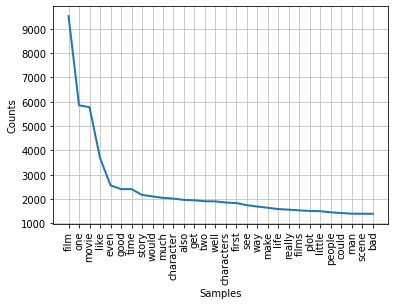

In [ ]:
# Frequency Distribution Plot
import matplotlib.pyplot as plt
fdist.plot(30,cumulative=False)
plt.show()

In [ ]:
dfsent.sentiment.value_counts()

0    1000
1    1000
Name: sentiment, dtype: int64

In [ ]:
dfsent.columns.values[0] = "sentence"
dfsent

,sentence,sentiment
0,plot two teen couples go church party drink dr...,0
1,happy bastard quick movie review damn k bug go...,0
2,movies like make jaded movie viewer thankful i...,0
3,quest camelot warner bros first feature length...,0
4,synopsis mentally unstable man undergoing psyc...,0
...,...,...
995,wow movie everything movie funny dramatic inte...,1
996,richard gere commanding actor always great fil...,1
997,glory starring matthew broderick denzel washin...,1
998,steven spielberg second epic film world war ii...,1


**Using scikit learn to calculate term frequency documents**

In [ ]:
dfsent

,sentence,sentiment
0,plot two teen couples go church party drink dr...,0
1,happy bastard quick movie review damn k bug go...,0
2,movies like make jaded movie viewer thankful i...,0
3,quest camelot warner bros first feature length...,0
4,synopsis mentally unstable man undergoing psyc...,0
...,...,...
995,wow movie everything movie funny dramatic inte...,1
996,richard gere commanding actor always great fil...,1
997,glory starring matthew broderick denzel washin...,1
998,steven spielberg second epic film world war ii...,1


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf = TfidfVectorizer(max_features=1000, lowercase=True, analyzer='word',
 stop_words= 'english',ngram_range=(1,1))
train_vect = tfidf.fit_transform(dfsent[0])


In [ ]:
train_vect

<2000x1000 sparse matrix of type '<class 'numpy.float64'>'
	with 215255 stored elements in Compressed Sparse Row format>

**The sentiment using the textblob library**

In [ ]:
dfsent[0].apply(lambda x: TextBlob(x).sentiment)

0         (0.012518857405221049, 0.519732771437317)
1         (0.07026515151515152, 0.3329545454545455)
2        (0.03471177944862158, 0.48256056808688386)
3      (-0.007339081683343981, 0.49355191256830594)
4       (0.013443877551020412, 0.46780612244897946)
                           ...                     
995       (0.28318820068820055, 0.6054159302236224)
996       (0.10486111111111111, 0.4605555555555555)
997      (0.02891316073354909, 0.44730235783633826)
998       (0.17194211017740432, 0.6498599439775911)
999        (0.1605182926829269, 0.5050667828106854)
Name: sentence, Length: 2000, dtype: object

In [ ]:
from gensim.models import KeyedVectors # load the Stanford GloVe model
for file in neg_files:
  urln = "https://raw.githubusercontent.com/sanaomaro/AIM-5001/main/txt_sentoken/neg"
  urlp = 'https://raw.githubusercontent.com/sanaomaro/AIM-5001/main/txt_sentoken/pos'
  pathn = urln + '/' + file +'word2vec'

  model = KeyedVectors.load_word2vec_format(pathn, binary=False)

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
import numpy as np
vectorizer = CountVectorizer(min_df=1)
print(vectorizer)

X = vectorizer.fit_transform(allwords) #X is Term-document matrix
print(X)

CountVectorizer()
  (0, 25627)	1
  (1, 35698)	1
  (2, 34172)	1
  (3, 7309)	1
  (4, 14163)	1
  (5, 5696)	1
  (6, 24614)	1
  (7, 10012)	1
  (8, 10023)	1
  (9, 13891)	1
  (10, 174)	1
  (11, 23690)	1
  (12, 14867)	1
  (13, 9009)	1
  (14, 14001)	1
  (15, 6953)	1
  (16, 30189)	1
  (17, 19660)	1
  (18, 23033)	1
  (19, 8176)	1
  (20, 37532)	1
  (21, 22313)	1
  (22, 31929)	1
  (23, 12491)	1
  (24, 7592)	1
  :	:
  (702696, 30422)	1
  (702697, 17512)	1
  (702698, 38258)	1
  (702699, 22847)	1
  (702700, 12444)	1
  (702701, 27525)	1
  (702702, 12261)	1
  (702703, 19707)	1
  (702704, 4795)	1
  (702705, 14504)	1
  (702706, 16479)	1
  (702707, 22847)	1
  (702708, 12444)	1
  (702709, 5930)	1
  (702710, 2747)	1
  (702711, 17397)	1
  (702712, 5849)	1
  (702713, 22915)	1
  (702714, 20035)	1
  (702715, 13101)	1
  (702716, 22974)	1
  (702717, 22957)	1
  (702718, 12444)	1
  (702719, 37782)	1
  (702720, 21033)	1


There are mainly two approaches for performing sentiment analysis.

Lexicon-based: count number of positive and negative words in given text and the larger count will be the sentiment of text.

Machine learning based approach: Develop a classification model, which is trained using the pre-labeled dataset of positive, negative, and neutral.

**Building the text classification model**

First, generate features using Bag of Words model by the ready library CountVectorizer, This matrix uses either one word or be a combination of two or more words, which is called a bigram or trigram model and the general approach is called the n-gram model.

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
from nltk.tokenize import RegexpTokenizer
#tokenizer to remove unwanted elements from out data like symbols and numbers
token = RegexpTokenizer(r'[a-zA-Z0-9]+')
cv = CountVectorizer(lowercase=True,stop_words='english',ngram_range = (1,1),tokenizer = token.tokenize)
text_counts= cv.fit_transform(dfsent[0])

In [ ]:
text_counts

<2000x38572 sparse matrix of type '<class 'numpy.int64'>'
	with 478110 stored elements in Compressed Sparse Row format>

Then split to train and test by 25% of the data size allocated for testing, which is applied to the sentences stored in dfsent dataframe

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(
    text_counts, dfsent[0], test_size=0.25, random_state=1)

**Multinomial Naive Bayes classifier**

Now we build our classifier and train it using the fit command, the classifier is Naiive bayes - multinomial.
It is a supervised learning classifications model that is used for the analysis of the categorical text data.

In [ ]:
from sklearn.naive_bayes import MultinomialNB
#Import scikit-learn metrics module for accuracy calculation
from sklearn import metrics
# Model Generation Using Multinomial Naive Bayes
clf = MultinomialNB().fit(X_train, y_train)
predicted= clf.predict(X_test)
print("MultinomialNB Accuracy:",metrics.accuracy_score(y_test, predicted))

MultinomialNB Accuracy: 0.002


Accuracy is so bad here

Again we generate term frequency using the neat method TfidVectorizer, it weights the ratio of information/ words and normalize it. 

We do this to use it in the next model traning.

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
tf=TfidfVectorizer()
text_tf= tf.fit_transform(dfsent[0])

Using the same size 25% for testing and the rest for training, and the same classifier.
 we get 0.004 accuracy - very bad.

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(
    text_tf,  dfsent[0], test_size=0.25, random_state=123)

In [ ]:
from sklearn.naive_bayes import MultinomialNB
from sklearn import metrics
# Model Generation Using Multinomial Naive Bayes
clf = MultinomialNB().fit(X_train, y_train)
predicted= clf.predict(X_test)
print("MultinomialNB Accuracy:",metrics.accuracy_score(y_test, predicted))

MultinomialNB Accuracy: 0.004
